# 1. Problem Definition

## Objective:

The goal of this project is to develop a deep learning model that can accurately classify fruits as either unripe or ripe across multiple fruit types. This classification can help in agriculture, food supply chain management, and automated quality control in fruit processing.

## Problem Statement:

Given an image of a fruit, predict both the fruit type (e.g., apple, banana, papaya) and its ripeness (unripe or ripe). The system should be able to generalize across different lighting conditions, backgrounds, and angles.

## Assumptions:

All fruit images are properly centered and clearly visible.

Images are captured with sufficient resolution for feature extraction.

The model will be used primarily for classification in controlled environments (e.g., farms, warehouses).

## Limitations:

The model may perform poorly on occluded or partially visible fruits.

Background clutter or unusual lighting can reduce prediction accuracy.

The dataset does not include all possible fruit varieties, limiting generalization.

Only 2 ripeness states are considered (raw vs. ripe), so partially ripe fruits may be misclassified.

## Dataset Description

### Source:

The dataset was obtained from kaggle and has fruit images containing 22 classes, with 11 types of fruits in unripe and ripe states.

### Structure (Dataset split):

Train: Images used for model training (70% of dataset)

Validation: Images used to tune hyperparameters (20% of dataset)

Test: Images used to evaluate the final model (10% of dataset)

Number of Classes:

Total Classes: 22 (11 fruits × 2 ripeness levels)

Classes: 'ripe apple', 'ripe banana', 'ripe dragon', 'ripe grapes', 'ripe lemon',
    'ripe mango', 'ripe orange', 'ripe papaya', 'ripe pineapple', 'ripe pomegranate',
    'ripe strawberry', 'unripe apple', 'unripe banana', 'unripe dragon',
    'unripe grapes', 'unripe lemon', 'unripe mango', 'unripe orange',
    'unripe papaya', 'unripe pineapple', 'unripe pomegranate', 'unripe strawberry'

### Data Characteristics:

Images have been resized to 224×224 for model input.

Augmentation applied to training set to improve generalization:

Rotation, width/height shifts, zoom, horizontal flip, brightness changes, shear, channel shifts.

Normalization applied from [0, 255] to [0.0, 1.0](pixel values scaled to 0–1).

### Challenges:

Variability in fruit shapes, sizes, and colors

Lighting differences and image noise

Similar appearance between some ripe and unripe fruits

# 2. Model Development

The deep learning model development for fruit classification was implemented as a complete MLflow-based pipeline on Google Colab with GPU acceleration. The pipeline began with mounting Google Drive and unzipping the dataset, followed by data preprocessing including normalization, augmentation, train-validation-test splitting, and computation of class weights. Ngrok was used to access mlflow ui. Using MLflow, an experiment was defined and all runs were logged to a persistent mlflow_runs folder on google drive to ensure reproducibility beyond Colab sessions. 

The model architecture was built on a ResNet50V2 base with three residual dense blocks, batch normalization, dropout, and a softmax output layer for 22 classes. Four optimizers were evaluated, with RMSprop selected based on training and validation curves logged in MLflow and evaluated on mlflow ui. The model was trained with categorical cross-entropy and monitored for metrics such as accuracy, AUC, precision, and recall, while all preprocessing, augmentation, hyperparameters, learning rate schedules, and optimizer configurations were logged as MLflow parameters. Custom artifacts including training/validation plots, confusion matrices, and classification reports were logged to provide visual insights. Three hyperparameter tuning methods was performed using the best selected optimizer (RMSprop) and Grid Search, Random Search, and Bayesian Optimization was performed, with each run tracked in MLflow (31 runs), enabling selection of the top runs per method based on minimal overfit gap and high validation performance. The overall best run was identified (Bayesian) and registered in the MLflow Model Registry, promoted through Staging for validation, and then moved to Production, providing a fully reproducible, trackable, and deployment-ready deep learning pipeline.

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Unzip Dataset
!rm -rf "/content/fruits"
!unzip -o "/content/drive/MyDrive/fruit_dataset.zip" -d "/content/fruits"

Archive:  /content/drive/MyDrive/fruit_dataset.zip
   creating: /content/fruits/fruit_dataset/
   creating: /content/fruits/fruit_dataset/ripe apple/
  inflating: /content/fruits/fruit_dataset/ripe apple/10.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/102.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/103.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/104.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/105.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/106.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/107.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/108.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/11.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/110.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/112.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/114.jpg  
  inflating: /content/fruits/fruit_dataset/ripe apple/115.jpg  
  inflating: /conten

In [ ]:
# Upgrade pip
!pip install --upgrade pip --quiet

# Install MLflow and pyngrok
!pip install --quiet \
    mlflow==2.14.3 \
    pyngrok==7.4.0 \
    "docker<8" \
    "graphene<4" \
    "querystring-parser<2" \
    "gunicorn<23" \
    "importlib-metadata<8" \
    "packaging<25" \
    "pyarrow>=15.0.0,<19" \
    "pytz<2025" \
    "protobuf>=4.25.3,<6"

In [ ]:
import tensorflow as tf
import mlflow

print("TensorFlow:", tf.__version__)
print("MLflow:", mlflow.__version__)

TensorFlow: 2.19.0
MLflow: 2.14.3


In [ ]:
# Imports
import os
import time
import shutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skimage import exposure
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, BackupAndRestore, TensorBoard
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import label_binarize
from mlflow.exceptions import MlflowException
from mlflow.models.signature import infer_signature

In [ ]:
# mlflow setup
import mlflow
import mlflow.tensorflow
from pyngrok import ngrok
import subprocess

In [ ]:
# Create a MLflow folder inside Google Drive
mlflow_drive_dir = "/content/drive/MyDrive/mlflow_runs"
import os
os.makedirs(mlflow_drive_dir, exist_ok=True)

In [ ]:
# Enable TensorFlow autologging
mlflow.tensorflow.autolog(log_models=True, log_datasets=False)

2025/10/22 13:36:51 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of tensorflow. If you encounter errors during autologging, try upgrading / downgrading tensorflow to a supported version, or try upgrading MLflow.


In [ ]:
# Start MLflow UI via ngrok

# Authenticate ngrok in Colab
from pyngrok import ngrok

# Set ngrok authtoken
NGROK_TOKEN = "33P0OLhfhI2VGm3IUmIdSI7WbLk_4ZFB1QGGoPYdCZ3QZGkQ7"
ngrok.set_auth_token(NGROK_TOKEN)

In [ ]:
# Kill old MLflow if already running
!ps aux | grep "mlflow ui" | grep -v grep | awk '{print $2}' | xargs -r kill -9 || echo "No MLflow instance running"

In [ ]:
# Kill old tunnels
ngrok.kill()

In [ ]:
# Start MLflow server bound to all interfaces
subprocess.Popen([
    "mlflow", "ui",
    "--backend-store-uri", f"sqlite:///{mlflow_drive_dir}/mlflow.db",
    "--default-artifact-root", mlflow_drive_dir,
    "--host", "0.0.0.0",
    "--port", "5000"
])

<Popen: returncode: None args: ['mlflow', 'ui', '--backend-store-uri', 'sqli...>

In [ ]:
# Wait a few seconds to ensure MLflow starts
time.sleep(5)

In [ ]:
# Point notebook to the same backend
mlflow.set_tracking_uri(f"http://127.0.0.1:5000")

In [ ]:
# Define experiment name
experiment_name = "Fruit_ResNet50V2"

# Create the experiment if it doesn't exist
if mlflow.get_experiment_by_name(experiment_name) is None:
    mlflow.create_experiment(
        name=experiment_name,
        artifact_location=mlflow_drive_dir  # store artifacts (models, plots)
    )

# Set the experiment for logging
mlflow.set_experiment(experiment_name)

print(f"MLflow experiment '{experiment_name}' is set!")

MLflow experiment 'Fruit_ResNet50V2' is set!


In [ ]:
# Retrieve experiment details
exp = mlflow.get_experiment_by_name(experiment_name)
print("Current Experiment:")
print(f"  ID: {exp.experiment_id}")
print(f"  Name: {exp.name}")
print(f"  Artifact Location: {exp.artifact_location}")

Current Experiment:
  ID: 1
  Name: Fruit_ResNet50V2
  Artifact Location: /content/drive/MyDrive/mlflow_runs


In [ ]:
# Open ngrok tunnel to access MLflow UI
mlflow_url = ngrok.connect(5000)
print("MLflow Tracking UI:", mlflow_url)

MLflow Tracking UI: NgrokTunnel: "https://unfuming-louanne-hinderingly.ngrok-free.dev" -> "http://localhost:5000"


In [ ]:
# Function to start an MLflow run with an auto-incremented run name based on previous runs
from mlflow.tracking import MlflowClient

def start_mlflow_run_auto(run_prefix="Run", nested=False):
    """
    Start a new MLflow run with an auto-incremented name.
    """
    experiment_name = "Fruit_ResNet50V2"
    mlflow.set_experiment(experiment_name)
    experiment = mlflow.get_experiment_by_name(experiment_name)

    # Use MlflowClient to fetch existing runs in the experiment
    client = MlflowClient()
    runs = client.search_runs([experiment.experiment_id])

    run_number = len(runs) + 1
    run_name = f"{run_prefix}_{run_number}"

    return mlflow.start_run(run_name=run_name, experiment_id=experiment.experiment_id, nested=nested)

In [ ]:
# paths for the dataset
source_dir = '/content/fruits/fruit_dataset'
destination_dir = '/content/fruit_data'

In [ ]:
# to list all class folder names inside the dataset
fruit_folders = sorted(os.listdir(source_dir))
print("Fruit Classes:", fruit_folders)

Fruit Classes: ['ripe apple', 'ripe banana', 'ripe dragon', 'ripe grapes', 'ripe lemon', 'ripe mango', 'ripe orange', 'ripe papaya', 'ripe pineapple', 'ripe pomegranate', 'ripe strawberry', 'unripe apple', 'unripe banana', 'unripe dragon', 'unripe grapes', 'unripe lemon', 'unripe mango', 'unripe orange', 'unripe papaya', 'unripe pineapple', 'unripe pomegranate', 'unripe strawberry']


In [ ]:
# Create directories and copy the relevant fruit folders
os.makedirs(destination_dir, exist_ok=True)

for folder in fruit_folders:
    src_folder = os.path.join(source_dir, folder)
    dst_folder = os.path.join(destination_dir, folder)

    # to only copy if destination folder doesn't already exist
    if not os.path.exists(dst_folder):
        shutil.copytree(src_folder, dst_folder)

print("All fruit folders copied to:", destination_dir)

All fruit folders copied to: /content/fruit_data


In [ ]:
# Function to split a dataset into train/validation/test folders while preserving class structure
def split_dataset(source_dir, destination_dir, train_size=0.7, val_size=0.2, test_size=0.1):

    # check for floating-point sum
    assert abs(train_size + val_size + test_size - 1.0) < 1e-6, \
           "Train, val, and test sizes must sum to 1."

    splits = ['train', 'val', 'test']
    split_dirs = {split: os.path.join(destination_dir, split) for split in splits}

    # Create base split directories
    for dir_path in split_dirs.values():
        os.makedirs(dir_path, exist_ok=True)

    # Iterate over classes
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # Create class folders inside each split folder
        for dir_path in split_dirs.values():
            os.makedirs(os.path.join(dir_path, class_name), exist_ok=True)

        # List images in class folder
        images = os.listdir(class_path)

        # Split into train and temp (val+test)
        train_imgs, temp_imgs = train_test_split(images, train_size=train_size, random_state=42)

        # Calculate relative val and test sizes
        val_ratio = val_size / (val_size + test_size)

        # Split temp into val and test
        val_imgs, test_imgs = train_test_split(temp_imgs, test_size=1 - val_ratio, random_state=42)

        # Copy images to their respective folders
        for img_list, split in zip([train_imgs, val_imgs, test_imgs], splits):
            for img in img_list:
                src = os.path.join(class_path, img)
                dst = os.path.join(split_dirs[split], class_name, img)
                shutil.copy(src, dst)

In [ ]:
# Splitting Dataset
source_dir = '/content/fruit_data'           # folder with copied data
destination_dir = '/content/fruit_split_data'  # folder where the train/val/test splits will be created

split_dataset(source_dir, destination_dir)

In [ ]:
# Class Distribution in the train split
split_dataset_path = '/content/fruit_split_data/train'  # the train folder path
class_names = [folder for folder in os.listdir(split_dataset_path)
               if os.path.isdir(os.path.join(split_dataset_path, folder))]

for class_name in class_names:
    class_path = os.path.join(split_dataset_path, class_name)
    num_images = len(os.listdir(class_path))
    print(f"{class_name}: {num_images} images")

unripe papaya: 115 images
ripe banana: 129 images
unripe mango: 203 images
ripe apple: 145 images
unripe pineapple: 63 images
unripe lemon: 123 images
ripe dragon: 189 images
unripe grapes: 161 images
ripe lemon: 98 images
ripe grapes: 100 images
unripe pomegranate: 112 images
unripe banana: 179 images
ripe papaya: 184 images
ripe orange: 105 images
ripe strawberry: 137 images
ripe pomegranate: 160 images
unripe orange: 77 images
unripe strawberry: 70 images
ripe pineapple: 138 images
unripe dragon: 99 images
ripe mango: 156 images
unripe apple: 133 images


In [ ]:
# Data Generators Setup for Raw vs Ripe Fruit
target_size = (224, 224)
batch_size = 30
num_classes = 22   # 11 raw + 11 ripe = 22 classes
channels = 3
epochs = 100

# data augmentation - this helps us to increase the size of the dataset and introduce variability in the dataset.
# data augmentation with keras by using the ImageDataGenerator class.
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=50,
    width_shift_range=0.3,
    height_shift_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=(0.4, 1.6),
    fill_mode='nearest',
    channel_shift_range=40.0,
    shear_range=25.0
)

val_datagen = ImageDataGenerator(
    rescale=1./255,
    brightness_range=[0.7, 1.3]
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
    brightness_range=[0.7, 1.3]
)

train_generator = train_datagen.flow_from_directory(
    '/content/fruit_split_data/train',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = val_datagen.flow_from_directory(
    '/content/fruit_split_data/val',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    '/content/fruit_split_data/test',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 2876 images belonging to 22 classes.
Found 818 images belonging to 22 classes.
Found 431 images belonging to 22 classes.


In [ ]:
# Check the train/val/test directories and print how many images each class contains in every split

import os

base_path = '/content/fruit_split_data'

# Check each split directory
for split in ['train', 'val', 'test']:
    split_path = os.path.join(base_path, split)
    print(f"\nContents of: {split_path}")

    if not os.path.exists(split_path):
        print(f" {split_path} does NOT exist!")
        continue

    class_folders = [folder for folder in os.listdir(split_path)
                     if os.path.isdir(os.path.join(split_path, folder))]

    print(f"Found {len(class_folders)} class folders.")

    for class_name in sorted(class_folders):
        class_path = os.path.join(split_path, class_name)
        num_images = len(os.listdir(class_path))
        print(f"   - {class_name}: {num_images} images")


Contents of: /content/fruit_split_data/train
Found 22 class folders.
   - ripe apple: 145 images
   - ripe banana: 129 images
   - ripe dragon: 189 images
   - ripe grapes: 100 images
   - ripe lemon: 98 images
   - ripe mango: 156 images
   - ripe orange: 105 images
   - ripe papaya: 184 images
   - ripe pineapple: 138 images
   - ripe pomegranate: 160 images
   - ripe strawberry: 137 images
   - unripe apple: 133 images
   - unripe banana: 179 images
   - unripe dragon: 99 images
   - unripe grapes: 161 images
   - unripe lemon: 123 images
   - unripe mango: 203 images
   - unripe orange: 77 images
   - unripe papaya: 115 images
   - unripe pineapple: 63 images
   - unripe pomegranate: 112 images
   - unripe strawberry: 70 images

Contents of: /content/fruit_split_data/val
Found 22 class folders.
   - ripe apple: 41 images
   - ripe banana: 37 images
   - ripe dragon: 54 images
   - ripe grapes: 28 images
   - ripe lemon: 27 images
   - ripe mango: 45 images
   - ripe orange: 30 ima

In [ ]:
# Calculate balanced class weights from the training data to handle class imbalance during model training

from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Compute class weights using train_generator
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

# Convert to dictionary format
class_weight_dict = dict(enumerate(class_weights))

# Print the class weights
print("Class Weights per Class Index:")
for class_index, weight in class_weight_dict.items():
    class_name = list(train_generator.class_indices.keys())[list(train_generator.class_indices.values()).index(class_index)]
    print(f"  {class_index} ({class_name}): {weight:.4f}")


Class Weights per Class Index:
  0 (ripe apple): 0.9016
  1 (ripe banana): 1.0134
  2 (ripe dragon): 0.6917
  3 (ripe grapes): 1.3073
  4 (ripe lemon): 1.3340
  5 (ripe mango): 0.8380
  6 (ripe orange): 1.2450
  7 (ripe papaya): 0.7105
  8 (ripe pineapple): 0.9473
  9 (ripe pomegranate): 0.8170
  10 (ripe strawberry): 0.9542
  11 (unripe apple): 0.9829
  12 (unripe banana): 0.7303
  13 (unripe dragon): 1.3205
  14 (unripe grapes): 0.8120
  15 (unripe lemon): 1.0628
  16 (unripe mango): 0.6440
  17 (unripe orange): 1.6978
  18 (unripe papaya): 1.1368
  19 (unripe pineapple): 2.0750
  20 (unripe pomegranate): 1.1672
  21 (unripe strawberry): 1.8675


In [ ]:
# Gradually unfreezes deeper layers of the base model during training
class GradualUnfreezing(tf.keras.callbacks.Callback):
    def __init__(self, base_model, layers_per_unfreeze=5, start_epoch=3, interval=3):
        super().__init__()
        self.base_model = base_model
        self.layers_per_unfreeze = layers_per_unfreeze
        self.start_epoch = start_epoch
        self.interval = interval
        self.unfrozen_layers = 0

    def on_epoch_end(self, epoch, logs=None):
        if epoch >= self.start_epoch and (epoch - self.start_epoch) % self.interval == 0:
            total_layers = len(self.base_model.layers)
            next_unfreeze = self.unfrozen_layers + self.layers_per_unfreeze
            if next_unfreeze <= total_layers:
                for layer in self.base_model.layers[-next_unfreeze: -self.unfrozen_layers or None]:
                    layer.trainable = True
                self.unfrozen_layers = next_unfreeze
                print(f"\n[Gradual Unfreezing] Unfrozen layers: last {self.unfrozen_layers} of {total_layers}")

In [ ]:
# model architecture
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras import layers, regularizers, Model, Input

def build_model(num_classes):
    # Initialize ResNet50V2 base
    base_model = ResNet50V2(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )

    # Freeze all layers initially
    for layer in base_model.layers:
        layer.trainable = False

    # Input layer
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = base_model(inputs)

    # Global pooling and dropout
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    # Residual block 1
    x1 = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-5))(x)
    x1 = layers.BatchNormalization()(x1)
    x1 = layers.Dropout(0.3)(x1)
    x_res = layers.Dense(1024, activation='linear')(x)
    x = layers.Add()([x_res, x1])
    x = layers.Activation('relu')(x)

    # Residual block 2
    x2 = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-5))(x)
    x2 = layers.Dropout(0.3)(x2)
    x_res2 = layers.Dense(512, activation='linear')(x)
    x = layers.Add()([x_res2, x2])
    x = layers.Activation('relu')(x)

    # Residual block 3
    x3 = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(1e-5))(x)
    x3 = layers.Dropout(0.3)(x3)
    x_res3 = layers.Dense(256, activation='linear')(x)
    x = layers.Add()([x_res3, x3])
    x = layers.Activation('relu')(x)

    # Final output layer
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Return fresh model
    return Model(inputs, outputs)

In [ ]:
# Load ResNet50V2 as the feature extractor and build the final classification model
base_model = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(target_size[0], target_size[1], channels)
)

model = build_model(num_classes)

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Learning Rate Schedule

initial_learning_rate = 1e-4
warmup_epochs = 5
total_epochs = epochs

def warmup_cosine_decay_schedule(epoch):
    if epoch < warmup_epochs:
        return initial_learning_rate * ((epoch + 1) / warmup_epochs)
    else:
        return initial_learning_rate * (
            0.5 * (1 + np.cos(np.pi * (epoch - warmup_epochs) / (total_epochs - warmup_epochs)))
        )

In [ ]:
# Save checkpoints and backup to Google Drive
checkpoint_dir = "/content/drive/MyDrive/fruit_checkpoints"
backup_dir = "/content/drive/MyDrive/fruit_backup"
tensorboard_log_dir = "/content/drive/MyDrive/fruit_tensorboard_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(backup_dir, exist_ok=True)
os.makedirs(tensorboard_log_dir, exist_ok=True)

In [ ]:
# Callbacks

callbacks = [
    # Stop training early if no improvement
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True,
        min_delta=1e-4,
        verbose=1
    ),

    # Save the best model based on validation accuracy
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'best_fruit_model_resnet50v2.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        save_weights_only=False,
        mode='max',
        verbose=1
    ),

    # Apply custom warmup and cosine decay learning rate
    tf.keras.callbacks.LearningRateScheduler(warmup_cosine_decay_schedule),

    # Gradually unfreeze base model layers
    GradualUnfreezing(base_model),

    # Automatically back up training in case of interruption
    #tf.keras.callbacks.BackupAndRestore(backup_dir=backup_dir),

    # Log training for TensorBoard visualization
    #tf.keras.callbacks.TensorBoard(log_dir=tensorboard_log_dir, histogram_freq=1)
]

Hyperparameter tuning - Multiple optimizers were tested: AdamW, SGD, RMSprop, and Nadam.

RMSprop was selected based on MLflow UI visualizations, as it provided the most stable training and validation curves with minimal overfitting.

In [ ]:
## 1) Manual Search - optimizer tuning

# Compile Model

# 1. AdamW
#from tensorflow.keras.optimizers import AdamW
#from tensorflow.keras.metrics import AUC, Precision, Recall

# Optimizer with weight decay
#optimizer = AdamW(
#    learning_rate=initial_learning_rate,
#    weight_decay=1e-4
#)

# 2. SGD (Momentum-based)
#from tensorflow.keras.optimizers import SGD

#optimizer = SGD(
#    learning_rate=initial_learning_rate,
#    momentum=0.9,
#    nesterov=True
#)

# 3. RMSprop (Hybrid adaptive)
from tensorflow.keras.optimizers import RMSprop

optimizer = RMSprop(
   learning_rate=initial_learning_rate,
    rho=0.9,
    momentum=0.9
)

# according to the plots logged and visualized in mlflow ui the RMSprop optimizer is comparatively is better because the training and validation curves are closely aligned. This indicates stable learning and
# good generalization. no prominent overfitting or underfitting as plots obtained from training with the other optimizers.

# 4. Nadam (Hybrid Adaptive)
#from tensorflow.keras.optimizers import Nadam
#from tensorflow.keras.metrics import AUC, Precision, Recall

#optimizer = Nadam(
#    learning_rate=initial_learning_rate,
#   beta_1=0.9,
#    beta_2=0.999,
#    epsilon=1e-7
#)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='auc'),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall')
    ]
)

In [ ]:
# summary of model architecture
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50v2          │ (None, 7, 7,      │ 23,564,800 │ input_layer_2[0]… │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50v2[0][0]  │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1024)      │  2,098,176 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1024)      │      4,096 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1024)      │  2,098,176 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 1024)      │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 1024)      │          0 │ dense_1[0][0],    │
│                     │                   │            │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 1024)      │          0 │ add[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 512)       │    524,800 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 512)       │    524,800 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 512)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 512)       │          0 │ dense_3[0][0],    │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512)       │          0 │ add_1[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 256)       │    131,328 │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 256)       │    131,328 │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 256)       │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 256)       │          0 │ dense_5[0][0],    │
│                     │                   │            │ dropout_3[0][0] 

 Total params: 29,091,350 (110.97 MB)

 Trainable params: 5,520,406 (21.06 MB)

 Non-trainable params: 23,570,944 (89.92 MB)

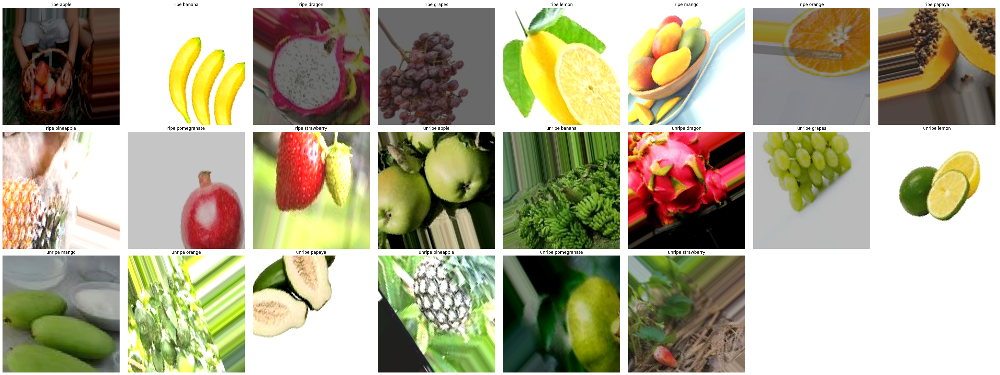

In [ ]:
# Show one sample image per class by looping through batches until all class labels are displayed once in a grid layout

import math

# Get class names from train_generator
class_names = [k for k, v in sorted(train_generator.class_indices.items(), key=lambda item: item[1])]

# Set up the grid with 3 rows
n_rows = 3
n_cols = math.ceil(len(class_names) / n_rows)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()  # Flatten to 1D list for easy indexing

# Track displayed classes
displayed_classes = set()

# Loop until we have one image per class
while len(displayed_classes) < len(class_names):
    images, labels = next(train_generator)
    for i in range(len(images)):
        label_idx = np.argmax(labels[i])
        if label_idx not in displayed_classes:
            axes[label_idx].imshow(images[i])
            axes[label_idx].set_title(f"{class_names[label_idx]}")
            axes[label_idx].axis('off')
            displayed_classes.add(label_idx)
        if len(displayed_classes) == len(class_names):
            break

# Hide any extra subplots (if total grid > number of classes)
for j in range(len(class_names), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

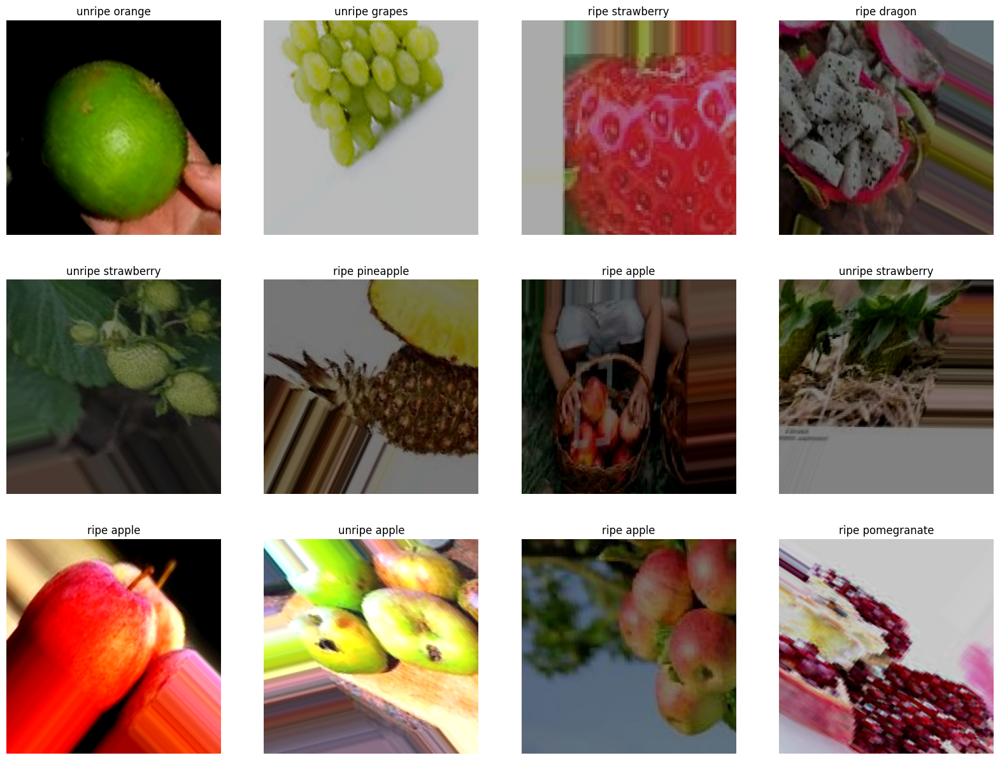

In [ ]:
# Display 12 augmented images from the training set in a 4x4 grid with their class labels
plt.figure(figsize=(20, 15))

for i in range(12):
    if i >= len(images):
        break
    ax = plt.subplot(3, 4, i + 1)  # 4 rows, 4 columns = 12 images
    img = images[i] * 255.0
    plt.imshow(img.astype("uint8"))
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis('off')

plt.show()

In [ ]:
# function to log training curves, confusion matrix, and classification report to MLflow using the trained model, its history, and the data generator.

def log_custom_metrics(history, model, generator):
    # Accuracy/Loss plots
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    ax[0].plot(history.history['accuracy'], label='train_acc')
    ax[0].plot(history.history['val_accuracy'], label='val_acc')
    ax[0].legend(); ax[0].set_title("Accuracy")

    ax[1].plot(history.history['loss'], label='train_loss')
    ax[1].plot(history.history['val_loss'], label='val_loss')
    ax[1].legend(); ax[1].set_title("Loss")

    plt.savefig("training_curves.png")
    mlflow.log_artifact("training_curves.png", artifact_path="plots")
    plt.close(fig)

    # Predictions for Confusion Matrix
    y_true = generator.classes
    y_pred = np.argmax(model.predict(generator), axis=1)

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=generator.class_indices.keys())
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title("Confusion Matrix")
    plt.savefig("confusion_matrix.png")
    mlflow.log_artifact("confusion_matrix.png", artifact_path="plots")
    plt.close()

    # Classification Report
    report = classification_report(y_true, y_pred, target_names=generator.class_indices.keys())
    with open("classification_report.txt", "w") as f:
        f.write(report)
    mlflow.log_artifact("classification_report.txt", artifact_path="reports")

In [ ]:
# MLflow run block that trains the model and logs all training details, metrics, and the saved model.
with start_mlflow_run_auto() as run:
    # Train model
    history = model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        validation_data=val_generator,
        validation_steps=len(val_generator),
        epochs=epochs,
        verbose=1,
        callbacks=callbacks,
        class_weight=class_weight_dict
    )

    # Log preprocessing and augmentation info
    mlflow.log_param("normalization", "rescale=1./255")
    mlflow.log_param(
        "train_augmentation",
        "rotation_range=50, width_shift_range=0.3, height_shift_range=0.3, zoom_range=0.3, horizontal_flip=True, brightness_range=(0.4,1.6), fill_mode='nearest', channel_shift_range=40.0, shear_range=25.0"
    )
    mlflow.log_param("target_size", "(224, 224)")
    mlflow.log_param("num_classes", 22)

    # Log model architecture info
    mlflow.log_param(
        "model_architecture",
        "ResNet50V2 base + 3 residual dense blocks + dropout + batchnorm"
    )
    mlflow.log_param("base_model", "ResNet50V2 (imagenet, include_top=False)")
    mlflow.log_param("frozen_layers", "All layers frozen initially")
    mlflow.log_param("activation_functions", "ReLU for hidden layers, Softmax for output")
    mlflow.log_param("regularization", "L2(1e-5)")

    # Log hyperparameters

    mlflow.log_param("num_classes", num_classes)
    mlflow.log_param("batch_size", batch_size)
    mlflow.log_param("epochs", epochs)

    # Log optimizer details from model
    opt_config = model.optimizer.get_config()
    mlflow.log_param("optimizer", model.optimizer.__class__.__name__)
    for k, v in opt_config.items():
        if isinstance(v, (dict, list)):
            v = str(v)
        mlflow.log_param(f"optimizer_{k}", v)

    # Log learning rate schedule parameters
    mlflow.log_param("initial_learning_rate", initial_learning_rate)
    mlflow.log_param("warmup_epochs", warmup_epochs)
    mlflow.log_param("total_epochs", total_epochs)
    mlflow.log_param("lr_schedule", "warmup_cosine_decay_schedule")

    # Evaluate test set
    test_loss, test_accuracy, test_auc, test_precision, test_recall = model.evaluate(test_generator, verbose=1)
    mlflow.log_metric("test_loss", test_loss)
    mlflow.log_metric("test_accuracy", test_accuracy)
    mlflow.log_metric("test_auc", test_auc)
    mlflow.log_metric("test_precision", test_precision)
    mlflow.log_metric("test_recall", test_recall)

    # Log artifacts (plots + metrics)
    log_custom_metrics(history, model, test_generator)

    # Log model & register in MLflow Registry
    try:
        mlflow.keras.log_model(
            model,
            artifact_path="fruit_classifier_model",
            registered_model_name="FruitClassifier"
        )
        print("Model registered successfully in MLflow Model Registry!")
    except MlflowException as e:
        print("Model registration failed:", e)

    print("Run completed with ID:", run.info.run_id)

MLflow Logging:

Training parameters, preprocessing details, data augmentation settings, optimizer configurations, learning rate schedules, and model architecture were logged as MLflow parameters.

Training and validation metrics were logged per epoch.

Custom metrics and artifacts were logged, including:

Accuracy and loss plots

Confusion matrix

Classification reports

Hyperparameter Tuning:

Three tuning strategies were applied: Grid Search, Random Search, and Bayesian Optimization.

Hyperparameters tuned: learning rate and batch size.

Each combination of parameters was trained as a separate MLflow run, and the same metrics and artifacts were logged.

The top 5 runs per method were selected based on validation performance and minimal overfit gap, and per-epoch accuracy/loss curves were plotted for comparison.

In [ ]:
## 2.1) Grid Search - learning rate and batch size tuning

# hyperparameter grid
# RMSprop is the chosen optimizer
from tensorflow.keras.optimizers import RMSprop

learning_rates = [1e-5, 1e-4, 1e-3]
batch_sizes = [30, 60, 90]

# Keep track of best metrics
best_val_accuracy = 0
best_run_id = None

In [ ]:
# Loop through hyperparameters and log each run

for lr in learning_rates:
    for batch in batch_sizes:

        # Update train generator batch size
        train_generator = train_datagen.flow_from_directory(
            '/content/fruit_split_data/train',
            target_size=target_size,
            batch_size=batch,
            class_mode='categorical',
            shuffle=True,
            seed=42
        )

        val_generator = val_datagen.flow_from_directory(
            '/content/fruit_split_data/val',
            target_size=target_size,
            batch_size=batch,
            class_mode='categorical',
            shuffle=False
        )

        # Define optimizer with current learning rate
        optimizer = RMSprop(
            learning_rate=lr,
            rho=0.9,
            momentum=0.9
        )

        model = build_model(num_classes)

        # Recompile the model
        model.compile(
            optimizer=optimizer,
            loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
            metrics=[
                'accuracy',
                tf.keras.metrics.AUC(name='auc'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall')
            ]
        )

        # Start a new MLflow run
        with start_mlflow_run_auto(run_prefix="RMSprop_Tuning") as run:

            history = model.fit(
                train_generator,
                steps_per_epoch=len(train_generator),
                validation_data=val_generator,
                validation_steps=len(val_generator),
                epochs=epochs,
                verbose=1,
                callbacks=callbacks,
                class_weight=class_weight_dict
            )

            # Log preprocessing / augmentation info
            mlflow.log_param("normalization", "rescale=1./255")
            mlflow.log_param(
                "train_augmentation",
                "rotation_range=50, width_shift_range=0.3, height_shift_range=0.3, zoom_range=0.3, horizontal_flip=True, brightness_range=(0.4,1.6), fill_mode='nearest', channel_shift_range=40.0, shear_range=25.0"
            )
            mlflow.log_param("target_size", "(224, 224)")
            mlflow.log_param("num_classes", 22)

            # Log model architecture info
            mlflow.log_param(
                "model_architecture",
                "ResNet50V2 base + 3 residual dense blocks + dropout + batchnorm"
            )
            mlflow.log_param("base_model", "ResNet50V2 (imagenet, include_top=False)")
            mlflow.log_param("frozen_layers", "All layers frozen initially")
            mlflow.log_param("activation_functions", "ReLU for hidden layers, Softmax for output")
            mlflow.log_param("regularization", "L2(1e-5)")

            # Log hyperparameters
            mlflow.log_param("optimizer", "RMSprop")
            mlflow.log_param("learning_rate", lr)
            mlflow.log_param("batch_size", batch)

            # Evaluate on test set
            test_metrics = model.evaluate(test_generator, verbose=0)
            metric_names = ["loss", "accuracy", "auc", "precision", "recall"]
            for name, value in zip(metric_names, test_metrics):
                mlflow.log_metric(f"test_{name}", value)

            # Log model and artifacts
            log_custom_metrics(history, model, test_generator)
            mlflow.keras.log_model(model, artifact_path="fruit_classifier_model")

            # Track best validation accuracy ( when logged val_accuracy comes from Keras during training, while MLflow recalculates validation_accuracy
            # afterward on the full validation set, causing slight differences.)
            val_acc = max(history.history['val_accuracy'])
            if val_acc > best_val_accuracy:
                best_val_accuracy = val_acc
                best_run_id = run.info.run_id

In [ ]:
import mlflow
from mlflow.tracking import MlflowClient
import matplotlib.pyplot as plt
import numpy as np
import random

In [ ]:
# function to train and log runs for random search and Bayesian optimization
def train_and_log_run(lr, batch_size, run_prefix="Run"):

    # End any leftover active run
    if mlflow.active_run() is not None:
        mlflow.end_run()

    # Initialize tracking variables inside the function
    best_val_accuracy = -float("inf")
    best_run_id = None

    # Create data generators
    train_generator = train_datagen.flow_from_directory(
        '/content/fruit_split_data/train',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )
    val_generator = val_datagen.flow_from_directory(
        '/content/fruit_split_data/val',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Build and compile model
    optimizer = RMSprop(learning_rate=lr, rho=0.9, momentum=0.9)
    model = build_model(num_classes)
    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=[
            'accuracy',
            tf.keras.metrics.AUC(name='auc'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall')
        ]
    )

    # Start MLflow run
    with start_mlflow_run_auto(run_prefix=run_prefix, nested=True) as run:
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            validation_data=val_generator,
            validation_steps=len(val_generator),
            epochs=epochs,
            verbose=1,
            callbacks=callbacks,
            class_weight=class_weight_dict
        )

        # Log hyperparameters
        mlflow.log_param("optimizer", "RMSprop")
        mlflow.log_param("learning_rate", lr)
        mlflow.log_param("batch_size", batch_size)

        # Log preprocessing and augmentation info
        mlflow.log_param("normalization", "rescale=1./255")
        mlflow.log_param(
            "train_augmentation",
            "rotation_range=50, width_shift_range=0.3, height_shift_range=0.3, zoom_range=0.3, horizontal_flip=True, brightness_range=(0.4,1.6), fill_mode='nearest', channel_shift_range=40.0, shear_range=25.0"
        )
        mlflow.log_param("target_size", "(224, 224)")
        mlflow.log_param("num_classes", 22)

        # Log model architecture info
        mlflow.log_param(
            "model_architecture",
            "ResNet50V2 base + 3 residual dense blocks + dropout + batchnorm"
        )
        mlflow.log_param("base_model", "ResNet50V2 (imagenet, include_top=False)")
        mlflow.log_param("frozen_layers", "All layers frozen initially")
        mlflow.log_param("activation_functions", "ReLU for hidden layers, Softmax for output")
        mlflow.log_param("regularization", "L2(1e-5)")

        # Evaluate test set
        test_metrics = model.evaluate(test_generator, verbose=0)
        metric_names = ["loss", "accuracy", "auc", "precision", "recall"]
        for name, value in zip(metric_names, test_metrics):
            mlflow.log_metric(f"test_{name}", value)

        # Log artifacts and history plots
        log_custom_metrics(history, model, test_generator)

        # Track best validation accuracy
        val_acc = max(history.history['val_accuracy'])
        if val_acc > best_val_accuracy:
            best_val_accuracy = val_acc
            best_run_id = run.info.run_id

        # Log best val accuracy for this run
        mlflow.log_metric("best_val_accuracy", best_val_accuracy)

        mlflow.keras.log_model(model, artifact_path=f"fruit_classifier_model_{best_run_id}")

In [ ]:
## 2.2) Random Search - learning rate and batch size tuning

random_runs = []
for _ in range(9):  # 9 random trials
    lr = 10 ** random.uniform(-5, -2)  # 1e-5 to 1e-2
    bs = random.choice([30, 60, 90, 120])
    run_info = train_and_log_run(lr, bs, run_prefix="Random")
    random_runs.append(run_info)

In [ ]:
## 2.3) Bayesian Optimization - learning rate and batch size tuning
bayesian_runs = []
lr_candidates = [1e-4, 3e-4, 5e-4] # 9 times
batch_candidates = [30, 60, 90]

for lr in lr_candidates:
    for bs in batch_candidates:
        run_info = train_and_log_run(lr, bs, run_prefix="Bayesian")
        bayesian_runs.append(run_info)

### Logged runs:

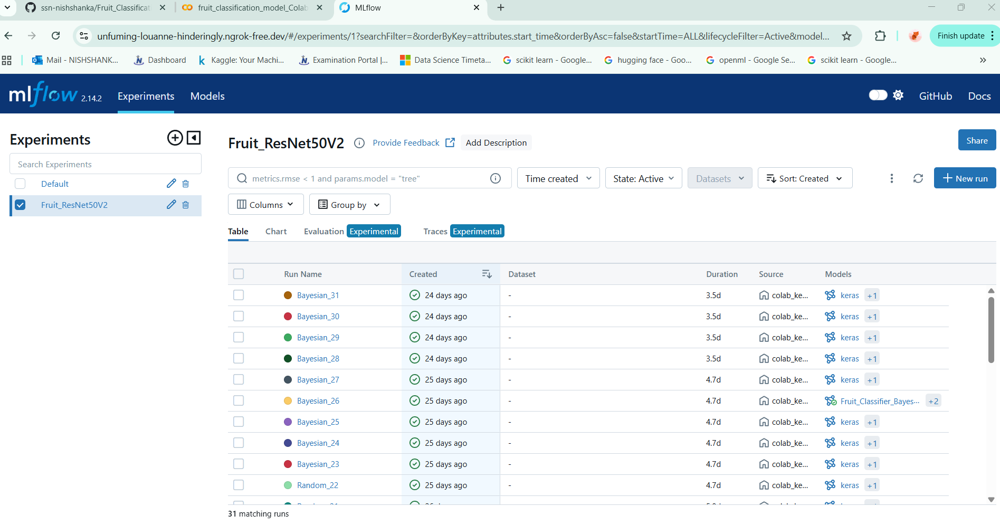

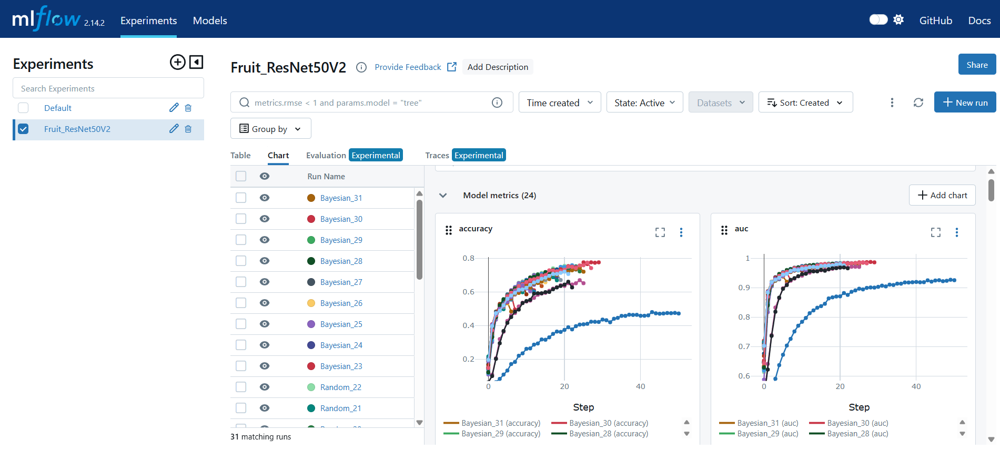

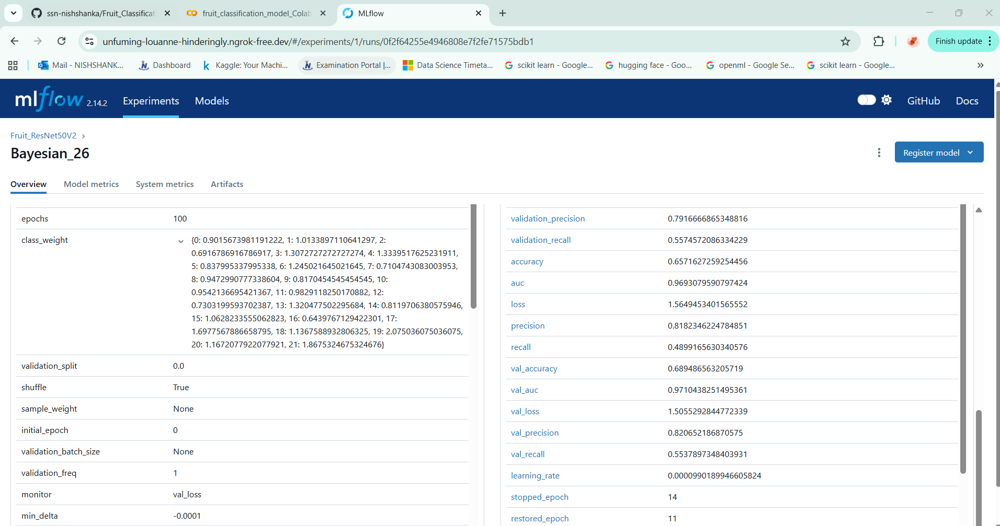

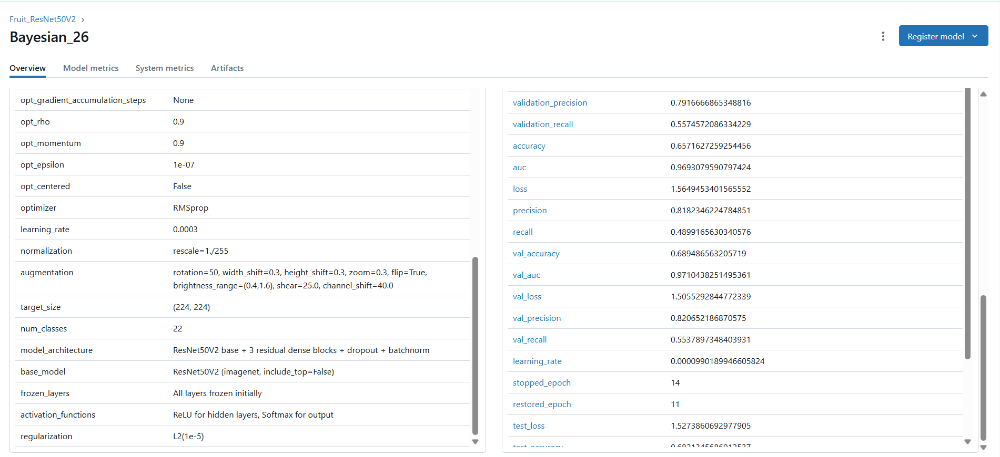

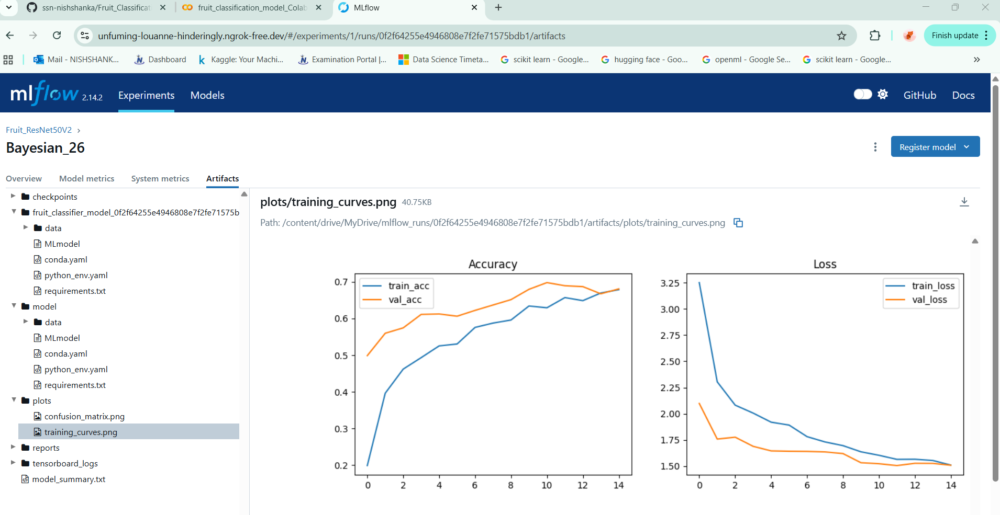

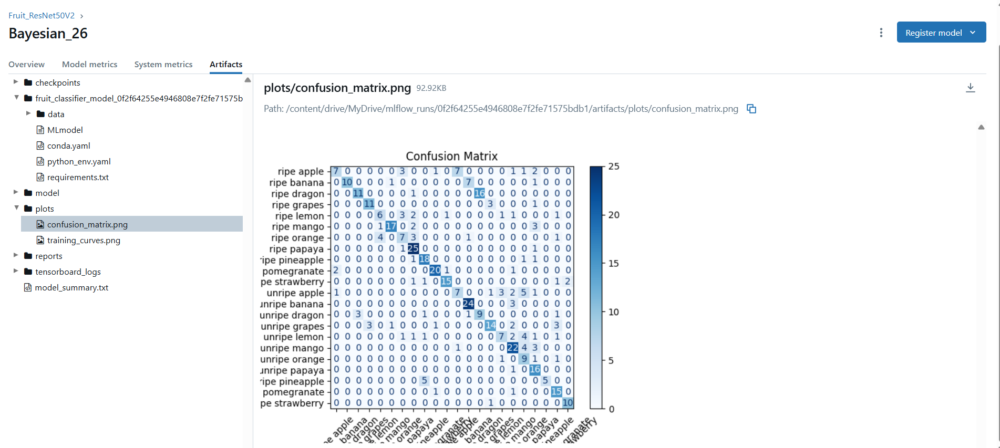


In [ ]:
# function to compute overfit and and score
from mlflow.tracking import MlflowClient

def compute_overfit_and_score(runs, name_prefix=None):
    """
    Compute overfit gap and composite score for existing MLflow runs.
    Optionally (if name is given) filter by run_name prefix (e.g., 'RMSprop_Tuning', 'Random', 'Bayesian').

    Args:
        runs: list of MLflow run objects
        name_prefix: string, if provided, only include runs whose run_name starts with this prefix

    Returns:
        list of dicts with 'run_id', 'train_acc', 'val_acc', 'val_auc', 'overfit_gap', 'score'
    """
    processed_runs = []

    for run in runs:
        if name_prefix and not run.info.run_name.startswith(name_prefix):
            continue  # skip runs not matching the prefix

        metrics = run.data.metrics
        train_acc = metrics.get("accuracy", 0)
        val_acc = metrics.get("val_accuracy", 0)
        val_auc = metrics.get("val_auc", 0)

        overfit_gap = train_acc - val_acc
        score = val_acc + val_auc

        processed_runs.append({
            "run_id": run.info.run_id,
            "run_name": run.info.run_name,
            "train_acc": train_acc,
            "val_acc": val_acc,
            "val_auc": val_auc,
            "overfit_gap": overfit_gap,
            "score": score
        })
    return processed_runs

# Fetch all runs from the experiment
client = MlflowClient()
experiment_name = "Fruit_ResNet50V2"
experiment = mlflow.get_experiment_by_name(experiment_name)
all_runs = client.search_runs([experiment.experiment_id])

# Filter & compute overfit/score per method
grid_runs = compute_overfit_and_score(all_runs, name_prefix="RMSprop_Tuning")
random_runs = compute_overfit_and_score(all_runs, name_prefix="Random")
bayesian_runs = compute_overfit_and_score(all_runs, name_prefix="Bayesian")

In [ ]:
# get the top-performing runs by minimizing overfitting and underfitting and maximizing validation performance.
def get_top_runs(runs, top_n=5):
    """
    Select top runs that balance generalization (small |overfit_gap|) and good validation performance.

    Args:
        runs (list): List of dicts with keys 'overfit_gap' and 'score'
        top_n (int): Number of top runs to return

    Returns:
        list: Top N runs sorted by (|overfit_gap| ascending, score descending)
    """
    if not runs:
        return []

    # Sort by smallest absolute overfit gap (avoiding both overfit and underfit)
    # and highest composite score (val_acc + val_auc)
    sorted_runs = sorted(runs, key=lambda x: (abs(x["overfit_gap"]), -x["score"]))
    return sorted_runs[:top_n]

In [ ]:
# Top 5 selection per method

top_grid = get_top_runs(grid_runs)
top_random = get_top_runs(random_runs)
top_bayesian = get_top_runs(bayesian_runs)

In [ ]:
# Plot per-epoch accuracy and loss curves for the top MLflow runs using their stored metric histories.

import matplotlib.pyplot as plt
from mlflow.tracking import MlflowClient

def plot_runs(top_runs, method_name="Method"):
    client = MlflowClient()

    for i, run_info in enumerate(top_runs):
        run_id = run_info["run_id"]
        run_name = run_info.get("run_name", run_id)

        # Retrieve per-epoch metric history
        def fetch_metric_series(metric_key):
            try:
                history = client.get_metric_history(run_id, metric_key)
                return [m.value for m in history]
            except Exception:
                return []

        train_acc = fetch_metric_series("accuracy")
        val_acc = fetch_metric_series("val_accuracy")
        train_loss = fetch_metric_series("loss")
        val_loss = fetch_metric_series("val_loss")

        # Plot Accuracy
        if train_acc and val_acc:
            plt.figure(figsize=(6, 4))
            plt.plot(train_acc, label="Train Accuracy")
            plt.plot(val_acc, label="Validation Accuracy")
            plt.title(f"{method_name} Top Run {i+1}: {run_name} — Accuracy")
            plt.xlabel("Epoch")
            plt.ylabel("Accuracy")
            plt.legend()
            plt.show()

        # Plot Loss
        if train_loss and val_loss:
            plt.figure(figsize=(6, 4))
            plt.plot(train_loss, label="Train Loss")
            plt.plot(val_loss, label="Validation Loss")
            plt.title(f"{method_name} Top Run {i+1}: {run_name} — Loss")
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()


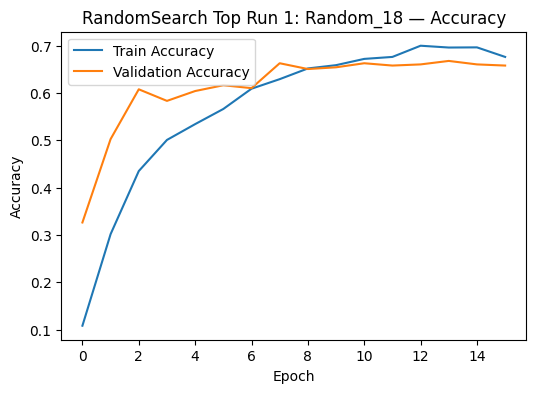

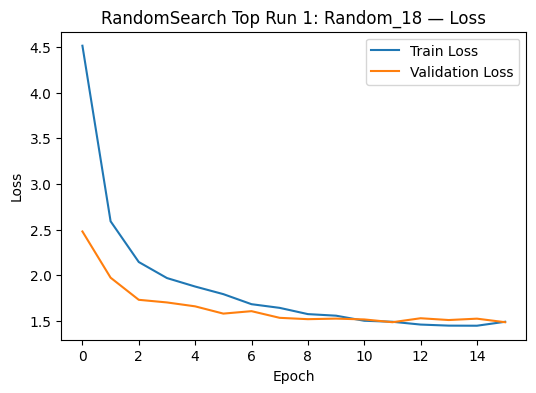

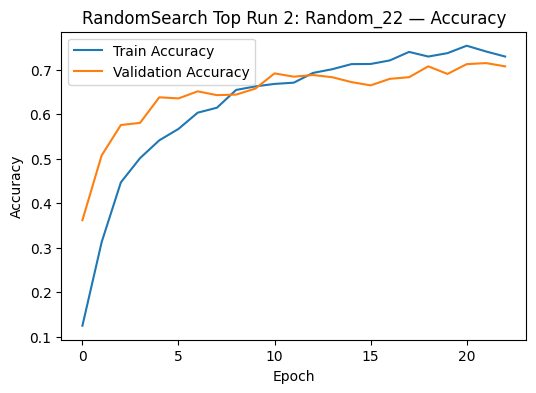

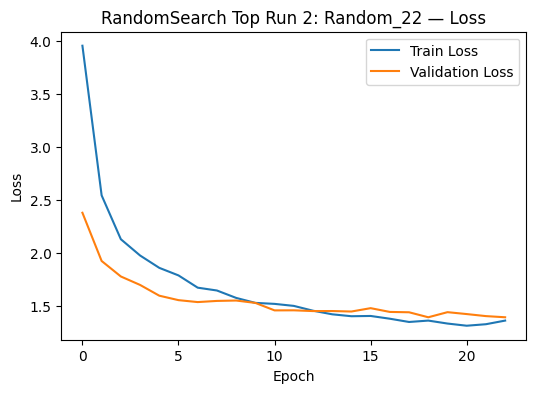

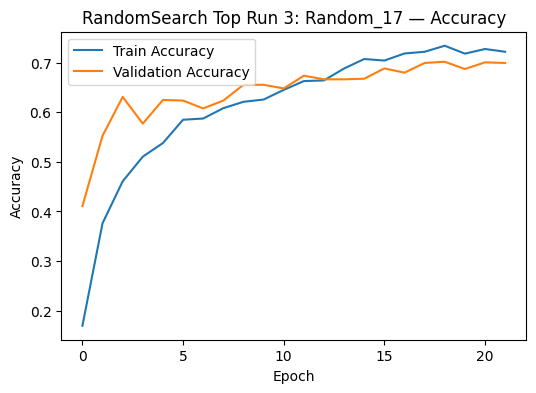

...

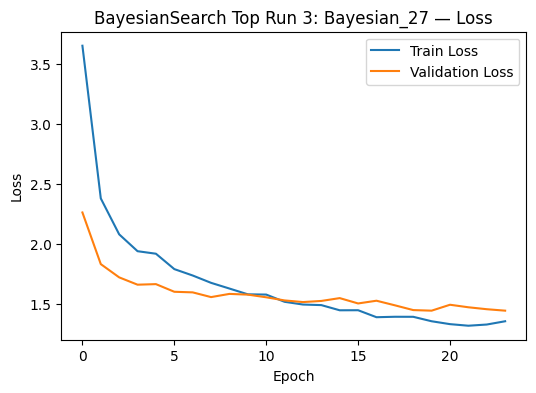

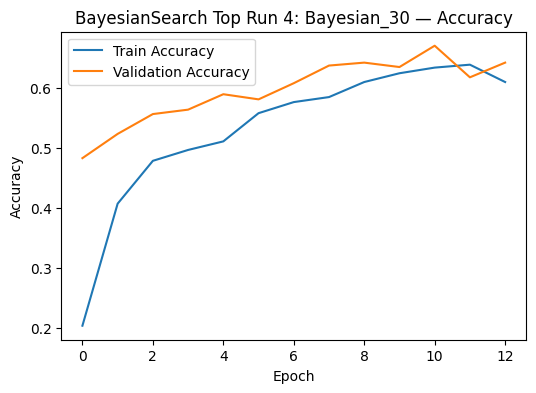

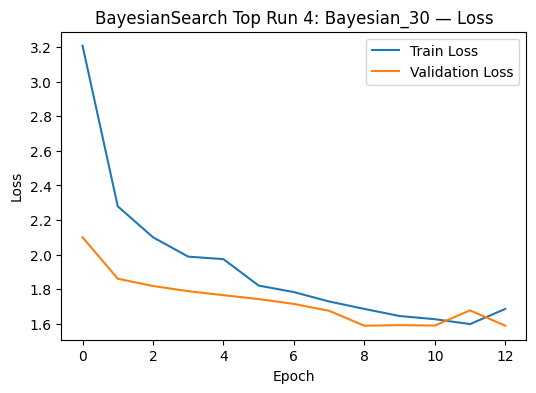

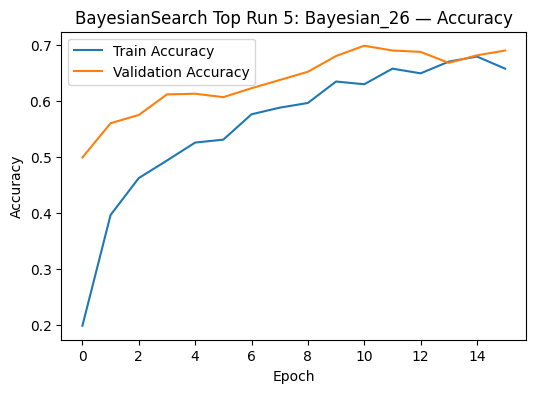

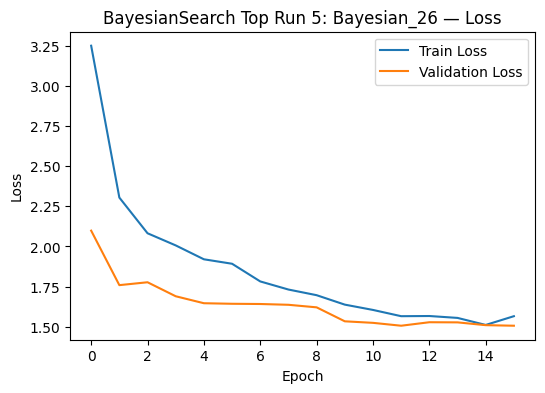

In [ ]:
# Plot top runs
plot_runs(top_grid, "GridSearch")
plot_runs(top_random, "RandomSearch")
plot_runs(top_bayesian, "BayesianSearch")

In [ ]:
# Compare overall best
all_top = top_grid + top_random + top_bayesian
overall_best = sorted(all_top, key=lambda x: (x["overfit_gap"], -x["score"]))[0]
best_run_id = overall_best["run_id"]
best_method = "GridSearch" if overall_best in top_grid else "RandomSearch" if overall_best in top_random else "BayesianSearch"
print(f"Overall best run: {best_run_id} from {best_method}")

import mlflow

# Fetch run metadata
best_run = mlflow.get_run(best_run_id)
best_run_name = best_run.info.run_name

print(f"Overall best run: {best_run_id} ({best_run_name}) from {best_method}")


Overall best run: 0f2f64255e4946808e7f2fe71575bdb1 from BayesianSearch
Overall best run: 0f2f64255e4946808e7f2fe71575bdb1 (Bayesian_26) from BayesianSearch


In [2]:
# The best-performing run was bayesian_26, as confirmed by both the computed evaluation metrics and by evaluating the accuracy/loss curves. These results 
# indicate that Bayesian Optimization produced superior hyperparameters for this model compared to the other search methods.

In [ ]:
# The best model is registered in MLflow Model Registry and promoted to Staging for validation.

# After verifying performance and stability, the model will be promoted to Production.

In [ ]:
# Register & promote

from mlflow.tracking import MlflowClient
from mlflow.exceptions import MlflowException
import mlflow

client = MlflowClient()

# Best run info
best_run_id = "0f2f64255e4946808e7f2fe71575bdb1"
best_run_name = mlflow.get_run(best_run_id).info.run_name  # "Bayesian_26"

# Generate model registry name
model_name = f"Fruit_Classifier_{best_run_name}"             # "Fruit_Classifier_Bayesian_26"

# Artifact path (matches how you logged it)
model_path_in_run = f"fruit_classifier_model_{best_run_id}"

# Ensure registered model exists
try:
    client.get_registered_model(model_name)
except MlflowException:
    client.create_registered_model(model_name)

# Register the version
model_version = client.create_model_version(
    name=model_name,
    source=f"runs:/{best_run_id}/{model_path_in_run}",
    run_id=best_run_id
)

# Promote to Staging
client.transition_model_version_stage(
    name=model_name,
    version=model_version.version,
    stage="Staging"
)

print(f"Model '{model_name}' version {model_version.version} promoted to Staging.")

2025/10/22 15:08:12 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Fruit_Classifier_Bayesian_26, version 1


Model 'Fruit_Classifier_Bayesian_26' version 1 promoted to Staging.


/tmp/ipython-input-3500649537.py:33: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


In [ ]:
# Optional manual override
"""
manual_best_run_id = "REPLACE_WITH_RUN_ID"
client.transition_model_version_stage(name=model_name, version=model_version.version, stage="Archived")
manual_model_version = client.create_model_version(
    name=model_name,
    source=f"runs:/{manual_best_run_id}/fruit_classifier_model",
    run_id=manual_best_run_id
)
client.transition_model_version_stage(name=model_name, version=manual_model_version.version, stage="Staging")
"""

In [ ]:
# Promote to Production (after validating performance, stability, and deployment readiness in Staging.)

client.transition_model_version_stage(
    name=model_name,
    version=model_version.version,
    stage="Production"
)

print(f"Best model (Run ID: {best_run_id}) is now in Production.")

Best model (Run ID: 0f2f64255e4946808e7f2fe71575bdb1) is now in Production.


/tmp/ipython-input-675261648.py:3: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


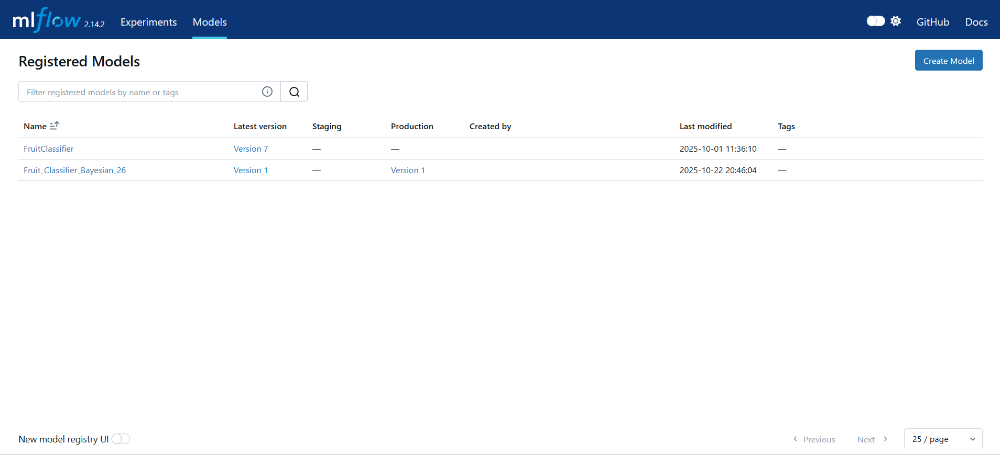

In [ ]:
# save model

import os

# Path to save model
save_path = "/content/best_fruit_model_resnet50v2.h5"

# Save entire model
model.save(save_path)
print(f"Model saved at {save_path}")

Model saved at /content/best_fruit_model_resnet50v2.h5


In [ ]:
# download saved model
from google.colab import files

files.download(save_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 3. MLOps implementation

## MLOps Workflow

1. Model Training & Logging

Conduct 31 training experiments with different optimizers and hyperparameters.

Log all runs to MLflow, including parameters, metrics, and artifacts.

2. Best Model Selection & Registry

Identify the best-performing model from the 31 runs.

Register it in MLflow Model Registry.

Promote the model through Staging to Production.

3. Version Control

Version the final training code, dataset, and model using Git + DVC to ensure reproducibility.

4. CI/CD Pipeline Setup

Implement GitHub Actions to automate the pipeline:
a. Pull the versioned code and DVC-tracked data.
b. Install dependencies.
c. Run the demo/reproducible training script (CICD script).
d. Build a Docker image containing the environment and Production model.
e. Deploy the Flask API container serving the Production model from MLflow.
f. Monitoring & Drift Detection.

The app runs locally and is accessible.

5. Production API (Dockerized)

Serve the Production model via the Dockerized Flask API.

Ensures consistent environment, portability, and reproducibility.

6. Monitoring & Drift Detection

Continuously monitor model performance, metrics, top-class confidence, and class distribution.

Trigger alerts or initiate retraining if drift or degradation is detected.

Logs can be viewed locally on mlflow ui.

## Version Control

GitHub & Git: All project code, scripts, and configuration files are tracked using Git.

### How can DVC be used here?

DVC (Data Version Control) is used in this project to efficiently manage large files—such as the fruit image dataset and trained deep-learning models—that cannot be versioned reliably with Git alone. By tracking these assets through lightweight .dvc files instead of storing the raw data in the repository, DVC enables clean Git commits while still maintaining full version history of datasets and model outputs. A secure Google Drive DVC remote is used to store the actual data, and access is handled through service-account credentials stored in GitHub Secrets. During development, DVC ensures that team members can pull the exact same dataset and model versions for reproducible experiments, while in the CI/CD pipeline, DVC automatically retrieves the required data and model before training or deployment using dvc pull. This integration allows code, data, and models to evolve together in a controlled and traceable manner, supporting reproducibility, collaboration, and automated MLOps workflows.

### DVC (Data Version Control):

The fruit dataset and trained model (best_fruit_model_resnet50v2.h5) are versioned with DVC.

DVC is configured to use a Google Drive remote via repository secrets (GDRIVE_SA_JSON, GDRIVE_CLIENT_ID, GDRIVE_CLIENT_SECRET).

This ensures data and model versions are reproducible and recoverable across environments.

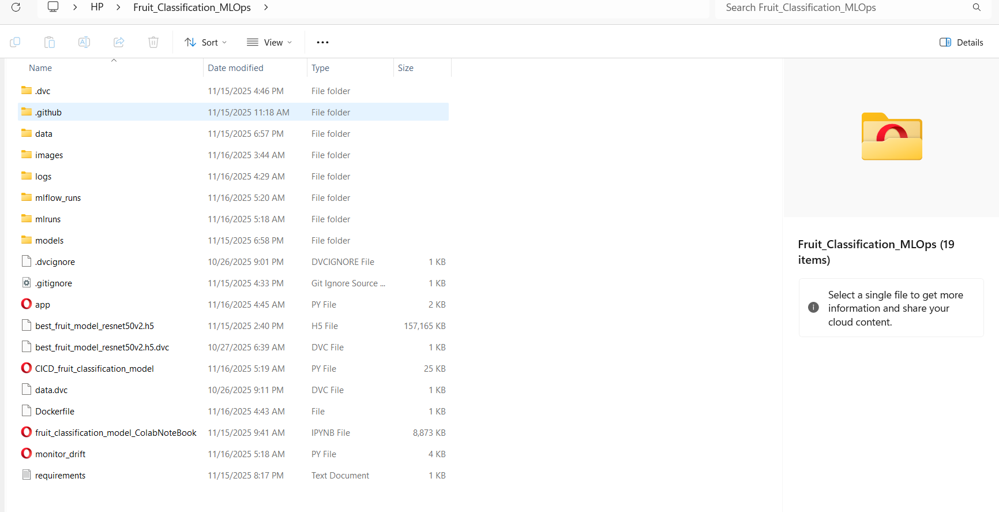

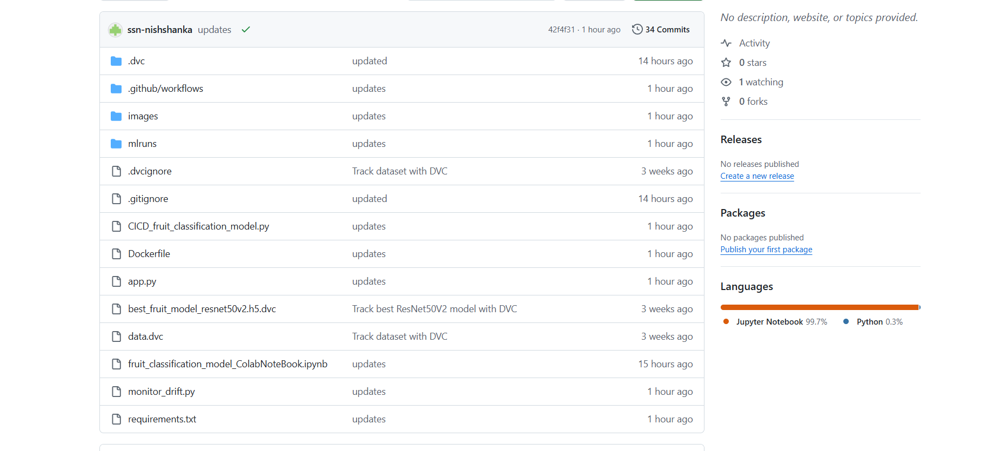

## CI/CD Pipeline

### Automation via GitHub Actions:

On push or pull request to main branch, the workflow automatically (Using the ci.yml file):

1. Checks out code.

2. Installs dependencies (requirements.txt) and libraries (tensorflow, mlflow, dvc[gdrive]).

3. Pulls dataset and model from DVC remote.

4. Runs the training script (CICD_fruit_classification_model.py) — this is a single, reproducible training run.

5. Builds a Docker container for the Flask API (Dockerfile and app.py).

6. Cleans up and runs the Docker container for serving the model.

7. Executes the drift monitoring script (monitor_drift.py) to log prediction statistics in MLflow.

Full automation of training, deployment, and monitoring ensures reproducibility, reduces manual work, and automatically verifies that the model runs correctly in the deployed environment.

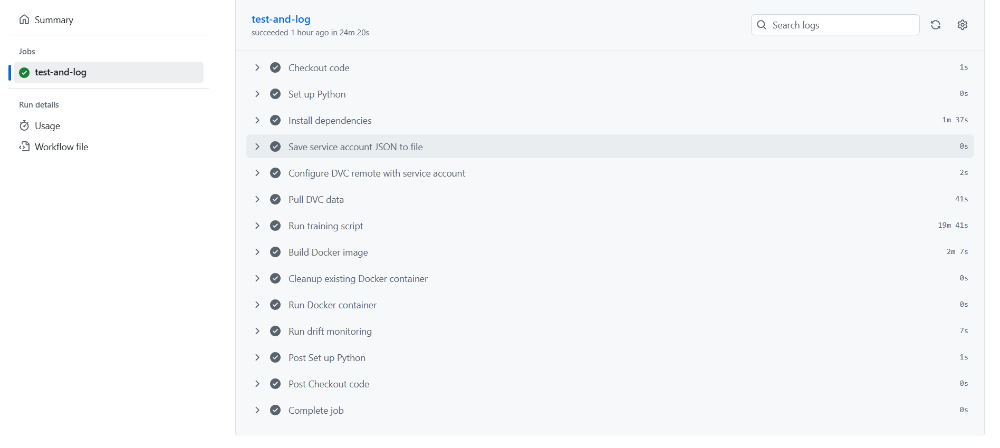

## Docker Containerization

### Dockerfile:

Uses python:3.11-slim as base.

Installs system and Python dependencies.

Copies the trained model, deployment script (app.py), and other necessary files.

Exposes Flask API port 5000.

Runs app.py to serve predictions.

### Flask API (app.py):

Serves the trained ResNet50V2 model.

Accepts image uploads via a web form.

Returns top 3 class predictions with confidence.

### Workflow:

The Docker container allows the model to be run anywhere without local Python environment setup.

Users can access predictions locally at http://localhost:5000.


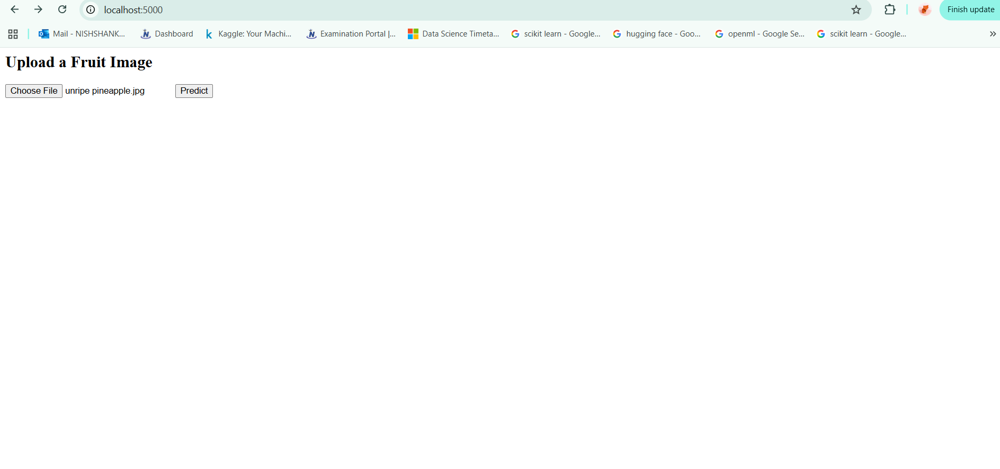


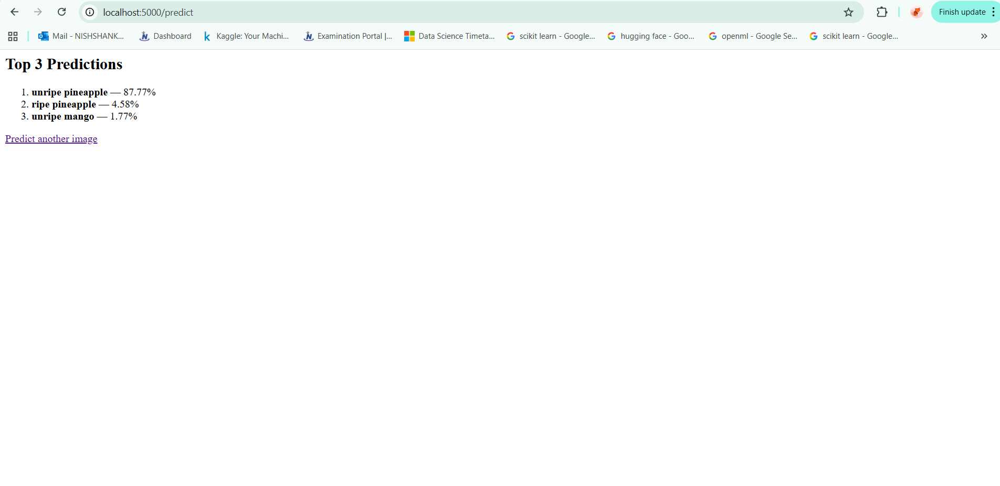

## Model Monitoring

### MLflow Tracking:

Logs training metrics, parameters, and artifacts during CI/CD training.

Stores drift monitoring metrics from monitor_drift.py.

### Drift Detection:

Monitors incoming images in the images/ folder.

Logs top-3 prediction confidence, class distribution, and image statistics.

Flags low-confidence predictions (<50%) as potential drift.

Logged in mlflow as:

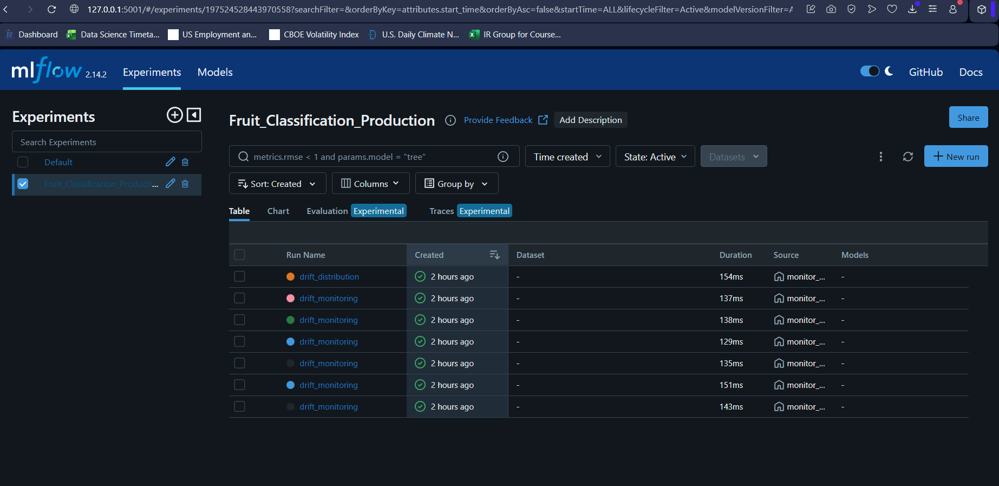

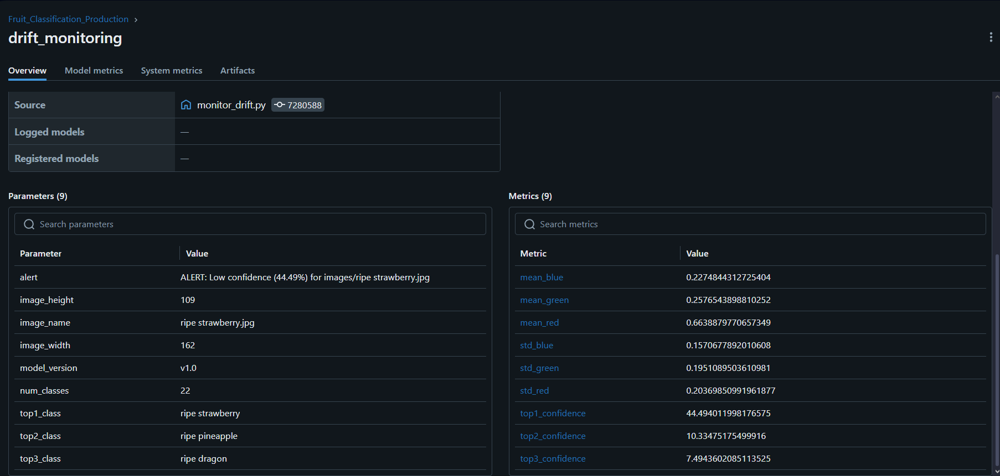

### Benefits:

Detects changes in input data or model performance over time.

Helps determine when retraining is required to maintain accuracy.

### Model drift study:

Model drift refers to the decline in model performance when new data becomes different from the training data. To study drift in this project, I built a monitoring script that evaluates the model on fresh fruit images and logs prediction confidence, top-3 classes, and image statistics to MLflow. If the model produces low confidence scores, the system flags a drift alert. The script also tracks changes in class distribution to identify shifts in the type of fruits the model sees over time. These logs help detect early drift so the model can be retrained when necessary.

## Project Workflow

Version Control → Git + DVC to track code, datasets, and model versions.

The notebook (fruit_classification_model_ColabNoteBook_Report.ipynb) contains full experiments, data exploration, and training runs.

It helps document the workflow, visualize results, and serve as a reference for CI/CD automation.

Development & Experimentation → Run and validate code in the notebook:

Explore dataset, test model architectures, and log multiple runs (31 runs with manual/looped experiments).

Once the workflow is finalized, the CI/CD training script (CICD_fruit_classification_model.py) was extracted for automated reproducible training.

CI/CD Pipeline → GitHub Actions automates the training script, DVC data pull, Docker build, and MLflow logging.

Docker Container → Package model + Flask API (app.py) for reproducible deployment.

Deployment → Run Docker container locally (or on cloud) to serve predictions via API.

Monitoring → MLflow logs metrics and monitor_drift.py ensures the model’s reliability and detects drift over time.